<a href="https://egfwd.com/"><img src = "https://raw.githubusercontent.com/abdelrazekrizk/FWD-Udacity-Wrangle-and-Analyze-Data-Twitter-API/main/FWD.jpg" align = "center"></a>




# Project: Investigate a Dataset (TMDb Movies Dataset)

## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#wrangling">Data Wrangling</a></li>
<li><a href="#EDA">Exploratory Data Analysis</a></li>
<li><a href="#conclusions">Conclusions</a></li>
</ul>

<a id='intro'></a>
## Introduction

In this section of the report, we will  introduce the dataset

This dataset was generated from The Movie Database API. This product uses the TMDb API but is not endorsed or certified by TMDb

What can we say about the success of a movie before it is released? Are there certain companies (Pixar?) that have found a consistent formula? Given that major films costing over $100 million to produce can still flop, this question is more important than ever to the industry. Film aficionados might have different interests. Can we predict which films will be highly rated, whether or not they are a commercial success?

In [1]:
# Use this cell to set up import statements for all of the packages that you
#   plan to use
# Remember to include a 'magic word' so that your visualizations are plotted
#   inline with the notebook. See this page for more:
#   http://ipython.readthedocs.io/en/stable/interactive/magics.html

import os              #this module routines for NT or Posix depending on what system we're on.
import pandas as pd    # this module 
import numpy as np     # library used for working with arrays. It also has functions for working in domain of linear algebra
import types
import csv
import seaborn         # provides a high-level interface for drawing attractive and informative statistical graphics.
import time            # This module provides various functions to manipulate time values.
import nbconvert       # This module converting notebooks to and from different formats
import pyppeteer       # Generate screenshots and PDFs of pages
import pip
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
%matplotlib inline

print ("libarary-Imported")

libarary-Imported


In [2]:
from IPython.display import HTML
from timeit import default_timer as timer
from pandas.core.tools.datetimes import to_datetime
from pandas.core.tools.timedeltas import to_timedelta
from nbconvert import LatexExporter
from nbconvert import PDFExporter
from nbconvert import webpdf 
from nbconvert import nbconvertapp
from nbconvert import templates

print ("functions-Imported")

functions-Imported


In [3]:
import os
os.getcwd()

'C:\\Users\\Abdelrazek\\Downloads\\investigate-tmdb-movies-dataset'

<a id='wrangling'></a>
## Data Wrangling

### General Properties

In [4]:
# Load your data and print out a few lines. Perform operations to inspect data
#   types and look for instances of missing or possibly errant data.
#loading the csv file and storing it in 'df'
df = pd.read_csv('tmdb-movies.csv')

In [5]:
#printing first two rows
df.head(2)

,id,imdb_id,popularity,budget,revenue,original_title,cast,homepage,director,tagline,keywords,overview,runtime,genres,production_companies,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
0,135397,tt0369610,32.985763,150000000,1513528810,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,http://www.jurassicworld.com/,Colin Trevorrow,The park is open.,monster|dna|tyrannosaurus rex|velociraptor|island,Twenty-two years after the events of Jurassic ...,124,Action|Adventure|Science Fiction|Thriller,Universal Studios|Amblin Entertainment|Legenda...,6/9/15,5562,6.5,2015,1.379999e+08,1.392446e+09
1,76341,tt1392190,28.419936,150000000,378436354,Mad Max: Fury Road,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,http://www.madmaxmovie.com/,George Miller,What a Lovely Day.,future|chase|post-apocalyptic|dystopia|australia,An apocalyptic story set in the furthest reach...,120,Action|Adventure|Science Fiction|Thriller,Village Roadshow Pictures|Kennedy Miller Produ...,5/13/15,6185,7.1,2015,1.379999e+08,3.481613e+08


In [6]:
#printing the last two rows
df.tail(2)

,id,imdb_id,popularity,budget,revenue,original_title,cast,homepage,director,tagline,keywords,overview,runtime,genres,production_companies,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
10864,21449,tt0061177,0.064317,0,0,"What's Up, Tiger Lily?",Tatsuya Mihashi|Akiko Wakabayashi|Mie Hama|Joh...,NaN,Woody Allen,WOODY ALLEN STRIKES BACK!,spoof,"In comic Woody Allen's film debut, he took the...",80,Action|Comedy,Benedict Pictures Corp.,11/2/66,22,5.4,1966,0.000000,0.0
10865,22293,tt0060666,0.035919,19000,0,Manos: The Hands of Fate,Harold P. Warren|Tom Neyman|John Reynolds|Dian...,NaN,Harold P. Warren,It's Shocking! It's Beyond Your Imagination!,fire|gun|drive|sacrifice|flashlight,A family gets lost on the road and stumbles up...,74,Horror,Norm-Iris,11/15/66,15,1.5,1966,127642.279154,0.0


In [7]:
#The dimensions of the dataset
df.shape

(10866, 21)

In [8]:
# display a summary of the dataframe,
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10866 entries, 0 to 10865
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    10866 non-null  int64  
 1   imdb_id               10856 non-null  object 
 2   popularity            10866 non-null  float64
 3   budget                10866 non-null  int64  
 4   revenue               10866 non-null  int64  
 5   original_title        10866 non-null  object 
 6   cast                  10790 non-null  object 
 7   homepage              2936 non-null   object 
 8   director              10822 non-null  object 
 9   tagline               8042 non-null   object 
 10  keywords              9373 non-null   object 
 11  overview              10862 non-null  object 
 12  runtime               10866 non-null  int64  
 13  genres                10843 non-null  object 
 14  production_companies  9836 non-null   object 
 15  release_date       

In [9]:
# view missing value count for archive 
df.isnull().sum()

id                         0
imdb_id                   10
popularity                 0
budget                     0
revenue                    0
original_title             0
cast                      76
homepage                7930
director                  44
tagline                 2824
keywords                1493
overview                   4
runtime                    0
genres                    23
production_companies    1030
release_date               0
vote_count                 0
vote_average               0
release_year               0
budget_adj                 0
revenue_adj                0
dtype: int64

In [10]:
# number not in the rating range(0-10)
df.vote_average.value_counts()   

6.1    496
6.0    495
5.8    486
5.9    473
6.2    464
6.3    461
6.5    457
6.4    446
5.7    415
6.6    413
5.6    412
5.5    380
6.7    376
5.3    358
5.4    338
6.8    326
6.9    315
5.2    300
7.0    279
7.1    267
5.1    256
7.2    219
5.0    217
4.9    206
7.3    191
4.8    185
4.7    151
7.4    135
4.6    121
7.5    120
4.5    114
4.4    101
7.6     89
4.3     80
4.2     74
4.1     62
7.8     62
7.7     62
4.0     55
7.9     46
3.8     39
3.9     39
8.0     37
3.5     31
3.6     29
3.3     22
3.4     19
3.7     19
8.1     16
3.1     13
8.3     10
8.4     10
3.0     10
3.2      9
2.9      9
2.4      7
2.8      7
8.5      6
8.2      6
2.2      3
2.7      3
2.1      3
2.6      3
2.5      2
1.5      2
2.3      2
8.8      2
8.9      1
8.6      1
9.2      1
8.7      1
2.0      1
Name: vote_average, dtype: int64

In [11]:

df.keywords .value_counts()

woman director                                                                                                                         134
independent film                                                                                                                        82
sport                                                                                                                                   25
duringcreditsstinger                                                                                                                    24
musical                                                                                                                                 24
suspense                                                                                                                                24
holiday                                                                                                                                 16
stand-up|stand up comedy   

In [12]:
df.production_companies .value_counts()

Paramount Pictures                                                                                                                                                                          156
Universal Pictures                                                                                                                                                                          133
Warner Bros.                                                                                                                                                                                 84
Walt Disney Pictures                                                                                                                                                                         76
Columbia Pictures                                                                                                                                                                            72
Metro-Goldwyn-Mayer (MGM)               

In [13]:
#check for duplicates in the data by imdb_id
df.imdb_id.duplicated

<bound method Series.duplicated of 0        tt0369610
1        tt1392190
2        tt2908446
3        tt2488496
4        tt2820852
5        tt1663202
6        tt1340138
7        tt3659388
8        tt2293640
9        tt2096673
10       tt2379713
11       tt1617661
12       tt0470752
13       tt2120120
14       tt2395427
15       tt3460252
16       tt2446042
17       tt0478970
18       tt1661199
19       tt1951266
20       tt1964418
21       tt1798684
22       tt2126355
23       tt2322441
24       tt1596363
25       tt2381249
26       tt2637276
27       tt2802144
28       tt1895587
29       tt4046784
30       tt3168230
31       tt1823672
32       tt2848292
33       tt3682448
34       tt1051904
35       tt3170832
36       tt1291570
37       tt1979388
38       tt2199571
39       tt2381111
40       tt1398426
41       tt1618442
42       tt2080374
43       tt1638355
44       tt1655441
45       tt3072482
46       tt2224026
47       tt3622592
48       tt2231253
49       tt3464902
50       tt2402

In [14]:
#check for duplicates in the data by id
df.id.duplicated()

0        False
1        False
2        False
3        False
4        False
5        False
6        False
7        False
8        False
9        False
10       False
11       False
12       False
13       False
14       False
15       False
16       False
17       False
18       False
19       False
20       False
21       False
22       False
23       False
24       False
25       False
26       False
27       False
28       False
29       False
30       False
31       False
32       False
33       False
34       False
35       False
36       False
37       False
38       False
39       False
40       False
41       False
42       False
43       False
44       False
45       False
46       False
47       False
48       False
49       False
50       False
51       False
52       False
53       False
54       False
55       False
56       False
57       False
58       False
59       False
60       False
61       False
62       False
63       False
64       False
65       False
66       F

In [15]:
df.keywords.unique

<bound method Series.unique of 0        monster|dna|tyrannosaurus rex|velociraptor|island
1         future|chase|post-apocalyptic|dystopia|australia
2        based on novel|revolution|dystopia|sequel|dyst...
3                    android|spaceship|jedi|space opera|3d
4                      car race|speed|revenge|suspense|car
5        father-son relationship|rape|based on novel|mo...
6        saving the world|artificial intelligence|cybor...
7              based on novel|mars|nasa|isolation|botanist
8        assistant|aftercreditsstinger|duringcreditssti...
9             dream|cartoon|imaginary friend|animation|kid
10       spy|based on novel|secret agent|sequel|james bond
11       jupiter|space|woman director|3d|interspecies r...
12       dancing|artificial intelligence|helicopter|dis...
13                  video game|nerd|alien attack|3d|pixels
14              marvel comic|comic|sequel|superhero|vision
15       bounty hunter|wyoming|mountains|hangman|voice ...
16               revenge|

In [16]:
df.sample

<bound method NDFrame.sample of            id    imdb_id  popularity     budget     revenue  \
0      135397  tt0369610   32.985763  150000000  1513528810   
1       76341  tt1392190   28.419936  150000000   378436354   
2      262500  tt2908446   13.112507  110000000   295238201   
3      140607  tt2488496   11.173104  200000000  2068178225   
4      168259  tt2820852    9.335014  190000000  1506249360   
5      281957  tt1663202    9.110700  135000000   532950503   
6       87101  tt1340138    8.654359  155000000   440603537   
7      286217  tt3659388    7.667400  108000000   595380321   
8      211672  tt2293640    7.404165   74000000  1156730962   
9      150540  tt2096673    6.326804  175000000   853708609   
10     206647  tt2379713    6.200282  245000000   880674609   
11      76757  tt1617661    6.189369  176000003   183987723   
12     264660  tt0470752    6.118847   15000000    36869414   
13     257344  tt2120120    5.984995   88000000   243637091   
14      99861  tt239542

In [17]:
df.describe()

,id,popularity,budget,revenue,runtime,vote_count,vote_average,release_year,budget_adj,revenue_adj
count,10866.000000,10866.000000,1.086600e+04,1.086600e+04,10866.000000,10866.000000,10866.000000,10866.000000,1.086600e+04,1.086600e+04
mean,66064.177434,0.646441,1.462570e+07,3.982332e+07,102.070863,217.389748,5.974922,2001.322658,1.755104e+07,5.136436e+07
std,92130.136561,1.000185,3.091321e+07,1.170035e+08,31.381405,575.619058,0.935142,12.812941,3.430616e+07,1.446325e+08
min,5.000000,0.000065,0.000000e+00,0.000000e+00,0.000000,10.000000,1.500000,1960.000000,0.000000e+00,0.000000e+00
25%,10596.250000,0.207583,0.000000e+00,0.000000e+00,90.000000,17.000000,5.400000,1995.000000,0.000000e+00,0.000000e+00
50%,20669.000000,0.383856,0.000000e+00,0.000000e+00,99.000000,38.000000,6.000000,2006.000000,0.000000e+00,0.000000e+00
75%,75610.000000,0.713817,1.500000e+07,2.400000e+07,111.000000,145.750000,6.600000,2011.000000,2.085325e+07,3.369710e+07
max,417859.000000,32.985763,4.250000e+08,2.781506e+09,900.000000,9767.000000,9.200000,2015.000000,4.250000e+08,2.827124e+09


### Data Cleaning 

#### cleaning steps in the second part of this section.


### 1. Rearrange columns 

In [18]:
df.columns

Index(['id', 'imdb_id', 'popularity', 'budget', 'revenue', 'original_title',
       'cast', 'homepage', 'director', 'tagline', 'keywords', 'overview',
       'runtime', 'genres', 'production_companies', 'release_date',
       'vote_count', 'vote_average', 'release_year', 'budget_adj',
       'revenue_adj'],
      dtype='object')

In [19]:
col = ['original_title','genres','release_year','id', 'imdb_id', 'popularity', 'budget', 'revenue',
       'cast', 'homepage', 'director', 'tagline', 'keywords', 'overview',
       'runtime', 'production_companies', 'release_date',
       'vote_count', 'vote_average', 'budget_adj',
       'revenue_adj']

df= df.reindex(columns=col)
       
       

In [20]:
df.columns

Index(['original_title', 'genres', 'release_year', 'id', 'imdb_id',
       'popularity', 'budget', 'revenue', 'cast', 'homepage', 'director',
       'tagline', 'keywords', 'overview', 'runtime', 'production_companies',
       'release_date', 'vote_count', 'vote_average', 'budget_adj',
       'revenue_adj'],
      dtype='object')

### 2. Removing columns with unnecessary Values

In [21]:
df.drop(['id', 'imdb_id','tagline','homepage','overview'], axis=1, inplace=True)

### 3. Changing the release date column into standard date format

In [22]:
df.release_date = pd.to_datetime(df['release_date'])

### 4. Changing format of budget and revenue columns

In [23]:
cols = ['budget', 'revenue','budget_adj', 'revenue_adj']
df[cols] = df[cols].applymap(np.int64)

In [24]:
df.dtypes

original_title                  object
genres                          object
release_year                     int64
popularity                     float64
budget                           int64
revenue                          int64
cast                            object
director                        object
keywords                        object
runtime                          int64
production_companies            object
release_date            datetime64[ns]
vote_count                       int64
vote_average                   float64
budget_adj                       int64
revenue_adj                      int64
dtype: object

 ### 5.Replace value "0" with mean 

In [25]:
df.revenue.value_counts()

0             6016
12000000        10
10000000         8
11000000         7
6000000          6
5000000          6
2000000          6
13000000         5
20000000         5
14000000         5
30000000         5
7000000          4
4300000          4
4000000          4
1000000          4
50000000         4
25000000         4
60000000         3
6700000          3
11               3
16000000         3
15               3
29000000         3
21000000         3
100000000        3
102000000        3
3                3
16               3
2500000          3
70000000         3
28000000         2
2300000          2
7900000          2
33000000         2
27900000         2
24922237         2
33395426         2
1500000          2
116000000        2
94000000         2
70687344         2
3000000          2
17000000         2
45300000         2
33400000         2
967000           2
9                2
37000000         2
35000000         2
7500000          2
1100000          2
18000000         2
152000000   

### mean value before Replace "0"value

In [26]:
revenue_mean= df.revenue.mean()
revenue_mean

39823319.79339223

In [27]:
budget_mean= df.budget.mean()
budget_mean

14625701.09414688

In [28]:
revenue_adj_mean= df.revenue_adj.mean()
revenue_adj_mean

51364363.03929689

In [29]:
budget_adj_mean= df.budget_adj.mean()
budget_adj_mean

17551039.596999817

In [30]:
df.loc[df['revenue'] == 0 , 'revenue'] = revenue_mean
df.loc[df['budget'] == 0 , 'budget'] = budget_mean
df.loc[df['revenue_adj'] == 0 , 'revenue_adj'] = revenue_adj_mean
df.loc[df['budget_adj'] == 0 , 'budget_adj'] = budget_adj_mean


### mean value after Replace "0"value with the mean

In [31]:
df.revenue.mean()

61871644.09645201

In [32]:
df.budget.mean()

22292551.216755074

In [33]:
df.revenue_adj.mean()

79802427.46451408

In [34]:
df.budget_adj.mean()

26754594.13626955

In [35]:
df.revenue.value_counts()

3.982332e+07    6016
1.200000e+07      10
1.000000e+07       8
1.100000e+07       7
2.000000e+06       6
5.000000e+06       6
6.000000e+06       6
1.300000e+07       5
1.400000e+07       5
2.000000e+07       5
3.000000e+07       5
4.000000e+06       4
7.000000e+06       4
4.300000e+06       4
2.500000e+07       4
5.000000e+07       4
1.000000e+06       4
2.100000e+07       3
1.020000e+08       3
3.000000e+00       3
2.500000e+06       3
6.700000e+06       3
1.000000e+08       3
1.600000e+07       3
6.000000e+07       3
1.100000e+01       3
1.500000e+01       3
7.000000e+07       3
2.900000e+07       3
1.600000e+01       3
2.790000e+07       2
8.000000e+06       2
3.500000e+07       2
7.900000e+06       2
1.479624e+07       2
1.100000e+08       2
5.000000e+00       2
1.440000e+07       2
3.100000e+06       2
1.500000e+07       2
2.980000e+07       2
9.400000e+07       2
3.339543e+07       2
9.500000e+06       2
3.300000e+07       2
7.600000e+07       2
3.000000e+06       2
2.400000e+07 

In [36]:
#calculate Profit for each of the movie
#add a new column in the dataframe name 'Profit' ,'Profit_adj'
df['Profit'] = df['revenue'] -df['budget']

df.head(2)

,original_title,genres,release_year,popularity,budget,revenue,cast,director,keywords,runtime,production_companies,release_date,vote_count,vote_average,budget_adj,revenue_adj,Profit
0,Jurassic World,Action|Adventure|Science Fiction|Thriller,2015,32.985763,150000000.0,1.513529e+09,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,Colin Trevorrow,monster|dna|tyrannosaurus rex|velociraptor|island,124,Universal Studios|Amblin Entertainment|Legenda...,2015-06-09,5562,6.5,137999939.0,1.392446e+09,1.363529e+09
1,Mad Max: Fury Road,Action|Adventure|Science Fiction|Thriller,2015,28.419936,150000000.0,3.784364e+08,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,George Miller,future|chase|post-apocalyptic|dystopia|australia,120,Village Roadshow Pictures|Kennedy Miller Produ...,2015-05-13,6185,7.1,137999939.0,3.481613e+08,2.284364e+08


 ### 7. making new Data Frame with profit with less Column

In [37]:
df_profit = df.drop(['revenue', 'budget','revenue_adj','budget_adj','cast','production_companies','genres','release_date','vote_count'], axis=1, inplace=True)
df_profit =df.to_csv (r'C:\Users\Abdelrazek\Downloads\investigate-tmdb-movies-dataset\movies-profit.csv', index = False, header=True)
df_profit = pd.read_csv('movies-profit.csv')
df_profit.head(2)

,original_title,release_year,popularity,director,keywords,runtime,vote_average,Profit
0,Jurassic World,2015,32.985763,Colin Trevorrow,monster|dna|tyrannosaurus rex|velociraptor|island,124,6.5,1.363529e+09
1,Mad Max: Fury Road,2015,28.419936,George Miller,future|chase|post-apocalyptic|dystopia|australia,120,7.1,2.284364e+08


In [38]:
df_profit.shape  

(10866, 8)

### 8. explore data with keywords 'woman director' and making new dataframe

In [39]:
df_woman_director=df_profit.loc[df_profit['keywords'] =='woman director']
df_woman_director.to_csv (r'C:\Users\Abdelrazek\Downloads\investigate-tmdb-movies-dataset\woman_director.csv', index = False, header=True)
df_woman_director = pd.read_csv('woman_director.csv')
df_woman_director.drop(['keywords'], axis=1, inplace=True)
df_woman_director.head(2)

,original_title,release_year,popularity,director,runtime,vote_average,Profit
0,Jenny's Wedding,2015,0.861179,Mary Agnes Donoghue,94,5.2,2.519762e+07
1,Careful What You Wish For,2015,0.586735,Elizabeth Allen Rosenbaum,91,5.4,3.182332e+07


In [40]:
df_woman_director.shape

(134, 7)

In [41]:
df_men_directort=df_profit.copy() 
print ("df_men_directort_ready")
df_men_directort.shape

df_men_directort_ready


(10866, 8)

 ### 9. making new Data Frame with out  woman director 

In [42]:
df_men_directort=df_profit.loc[df_profit['keywords'] !='woman director']
df_men_directort.to_csv (r'C:\Users\Abdelrazek\Downloads\investigate-tmdb-movies-dataset\men_directort.csv', index = False, header=True)
df_men_directort = pd.read_csv('men_directort.csv')
df_men_directort.drop(['keywords'], axis=1, inplace=True)
df_men_directort.head(2)

,original_title,release_year,popularity,director,runtime,vote_average,Profit
0,Jurassic World,2015,32.985763,Colin Trevorrow,124,6.5,1.363529e+09
1,Mad Max: Fury Road,2015,28.419936,George Miller,120,7.1,2.284364e+08


In [43]:
df_men_directort.shape

(10732, 7)


<a id='EDA'></a>

### Exploratory Data Analysis

> **Tip**: Now that you've trimmed and cleaned your data, you're ready to move on to exploration. Compute statistics and create visualizations with the goal of addressing the research questions that you posed in the Introduction section. It is recommended that you be systematic with your approach. Look at one variable at a time, and then follow it up by looking at relationships between variables.

### Explore what the histogram of the data looks like

#### Explore Men_Director

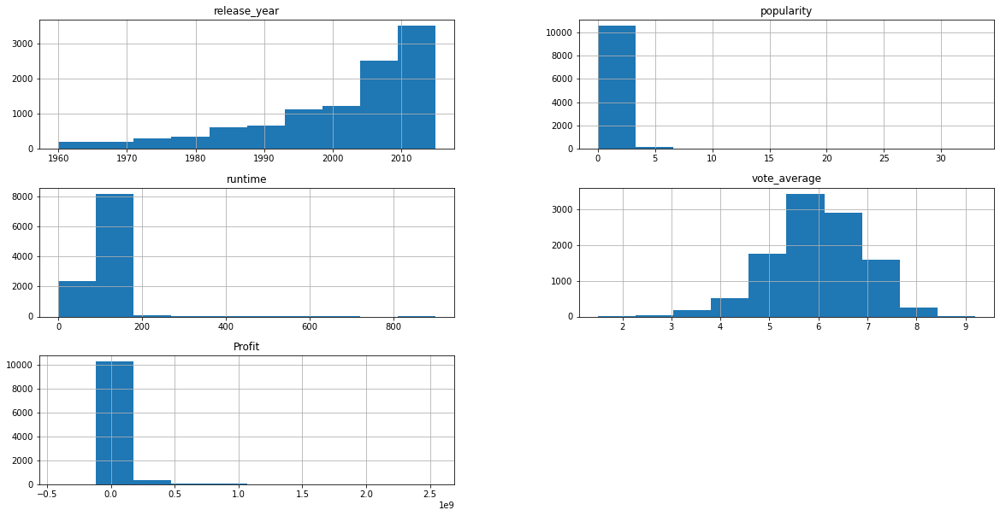

In [44]:
df_men_directort.hist(figsize=(20,10));

#### Explore Woman_Director

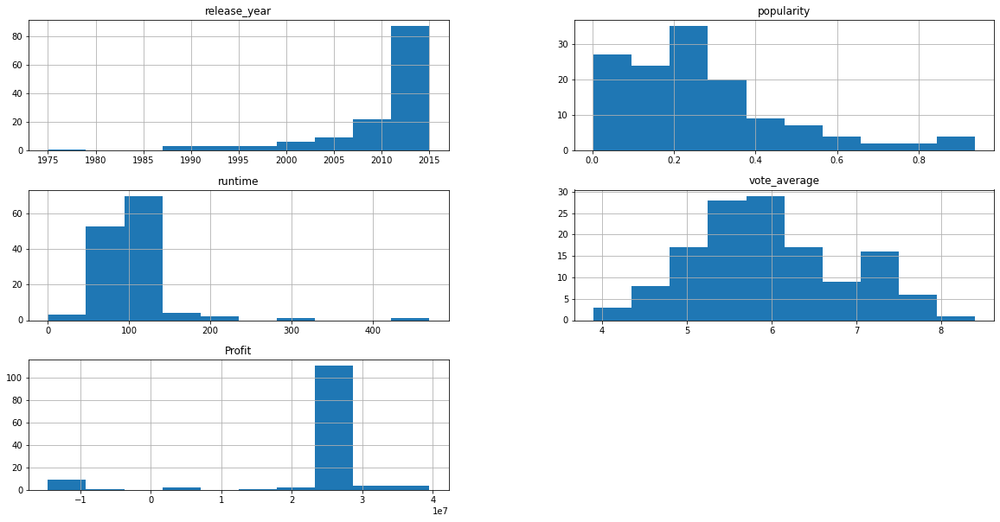

In [45]:
df_woman_director.hist(figsize=(20,10));

**1. we can notice that woman start director films to be notice more than 15 year after 2000**

**2. women like to directer short film and a little make long film**

**3. men like to directer films between 120 and 180 min**


### Research Question 1 

##### What is the relationship between runtime and profit?

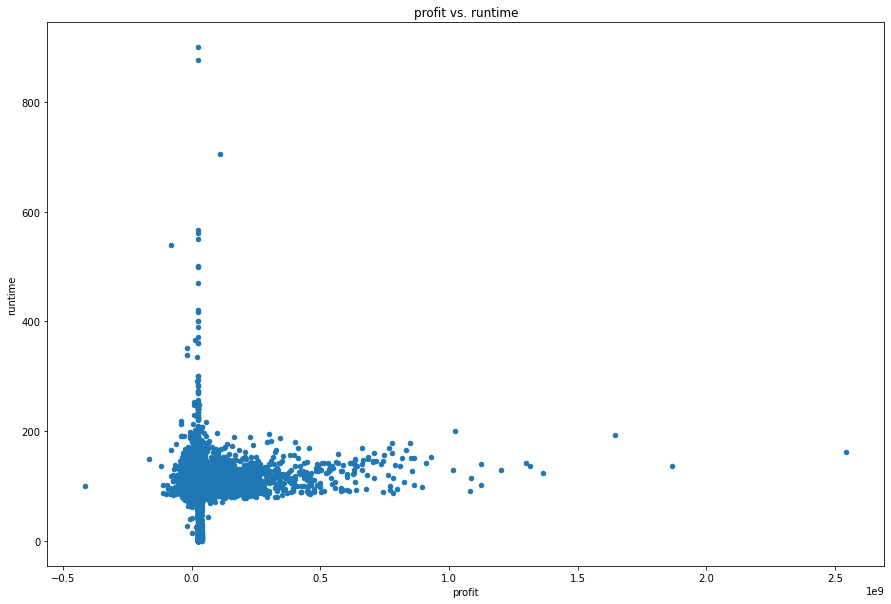

In [46]:
# Plot scatter plot of these two columns
df_profit.plot(x='Profit', y='runtime', kind='scatter', figsize=(15,10))
plt.title('profit vs. runtime')
plt.xlabel('profit')
plt.ylabel('runtime');

**. most films runtime between 100 min to 200 min make profit 0 and o.5 million $**

### Research Question 2 

#### what Movies with most and least profit?

In [47]:
# men_directort_Movies_best_profit_info
df_men_directort_best_profit=df_men_directort.sort_values(['Profit', 'original_title'], ascending=[False, True])
df_men_directort_best_profit.Profit = df.Profit.astype(int)
print(df_men_directort_best_profit.head(1).to_markdown())

|      | original_title   |   release_year |   popularity | director      |   runtime |   vote_average |   Profit |
|-----:|:-----------------|---------------:|-------------:|:--------------|----------:|---------------:|---------:|
| 1358 | Avatar           |           2009 |      9.43277 | James Cameron |       162 |            7.1 | 25197618 |


In [48]:
# men_directort_Movies_Least_profit_info
df_men_directort_Least_profit=df_men_directort.sort_values(['Profit', 'original_title'], ascending=[False, True])
print(df_men_directort_Least_profit.tail(1).to_markdown())

|      | original_title    |   release_year |   popularity | director   |   runtime |   vote_average |       Profit |
|-----:|:------------------|---------------:|-------------:|:-----------|----------:|---------------:|-------------:|
| 2204 | The Warrior's Way |           2010 |      0.25054 | Sngmoo Lee |       100 |            6.4 | -4.13912e+08 |


In [49]:
# woman_director_Movies_best_profit_info
df_woman_director_best_profit=df_woman_director.sort_values(['Profit', 'original_title'], ascending=[False, True])
HTML(df_woman_director_best_profit.head(1).to_html(classes='table table-striped'))

,original_title,release_year,popularity,director,runtime,vote_average,Profit
113,Old Joy,2006,0.084514,Kelly Reichardt,73,6.4,3.952332e+07


In [50]:
# woman_director_Movies_Least_profit_info
df_woman_director_least_profit=df_woman_director.sort_values(['Profit', 'original_title'], ascending=[False, True])
HTML(df_woman_director_least_profit.tail(1).to_html(classes='table table-striped'))

,original_title,release_year,popularity,director,runtime,vote_average,Profit
79,A Case of You,2013,0.433434,Kat Coiro,91,5.3,-1.462151e+07


<a href="https://egfwd.com/"><img src = "https://roadtovrlive-5ea0.kxcdn.com/wp-content/uploads/2017/10/udacity-logo.png" align = "center"></a>